<a href="https://colab.research.google.com/github/fridymandita/KCBV/blob/main/Pengolahan_Citra_Edge_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Edge detection

In [7]:
from google.colab import files
file = files.upload()

Saving Bikesgray.jpg to Bikesgray.jpg


In [8]:
import plotly.io as pio

if (pio.renderers.default != "vscode") & (pio.renderers.default != "colab"):
    pio.renderers.default = "iframe_connected"

In [9]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import plotly.express as px

figsize = (10, 10)

## Gambar Asli

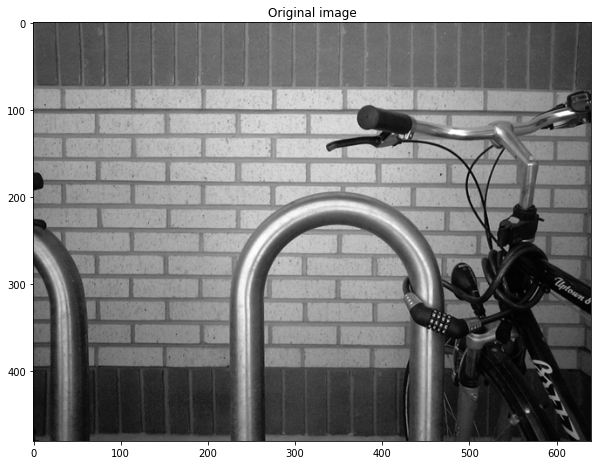

In [11]:
img = cv2.imread("Bikesgray.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=figsize)
plt.imshow(img, cmap="gray", vmin=0, vmax=255)
plt.title("Original image")
plt.show()

## Gambar magnitude dan fase

In [12]:
img = img.astype(float)

kernel = 1 / 8 * np.array([[-1, 0, +1], [-2, 0, +2], [-1, 0, +1]])
sobel_x = cv2.filter2D(img, -1, kernel)

kernel = kernel.T
sobel_y = cv2.filter2D(img, -1, kernel)

mag_img = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

phase_img = cv2.phase(sobel_x, -sobel_y, angleInDegrees=True)

phase_img_masked = -100 * np.ones(phase_img.shape)
TH_PRC = 0.15
th = mag_img.max() * TH_PRC
phase_img_masked = phase_img_masked * (mag_img <= th) + phase_img * (mag_img > th)


px.imshow(mag_img, title="Gradient magnitude")


In [13]:
px.imshow(phase_img_masked, title="Gradient phase thresholeded")

# Penipisan Tepi

In [14]:
kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
dst_LoG = cv2.filter2D(img, -1, kernel)

px.imshow(np.abs(dst_LoG), title="abs LoG")


## Non Maximum Suppression (NMS) 

In [15]:
phase_img_q = phase_img.copy()
for i in range(mag_img.shape[0]):
    for j in range(mag_img.shape[1]):
        phase_img_q[i, j] = np.mod(phase_img_q[i, j] + 22.5, 180)
        phase_img_q[i, j] = (phase_img_q[i, j]) // 45  # integer devider

phase_img_q_masked = -1 * np.ones(phase_img.shape)
TH_PRC = 0.1
th = mag_img.max() * TH_PRC
phase_img_q_masked = phase_img_q_masked * (mag_img <= th) + phase_img_q * (mag_img > th)

px.imshow(phase_img_q_masked, title="Gradient phase- quantized and thresholded")


##Langkah Utama NMS

In [16]:
nms = mag_img.copy()

for i in range(1, mag_img.shape[0] - 1):
    for j in range(1, mag_img.shape[1] - 1):
        if phase_img_q[i, j] == 0 and (mag_img[i, j + 1] > mag_img[i, j] or mag_img[i, j - 1] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 1 and (mag_img[i + 1, j - 1] > mag_img[i, j] or mag_img[i - 1, j + 1] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 2 and (mag_img[i - 1, j] > mag_img[i, j] or mag_img[i + 1, j] > mag_img[i, j]):
            nms[i, j] = -50
        if phase_img_q[i, j] == 3 and (mag_img[i - 1, j - 1] > mag_img[i, j] or mag_img[i + 1, j + 1] > mag_img[i, j]):
            nms[i, j] = -50

px.imshow(nms, title="NMS")


##Double TH

In [17]:
nms_th = np.zeros(nms.shape)
TH_l = 3
TH_h = 13
nms_th[nms >= TH_h] = 2
nms_th[np.bitwise_and(TH_l <= nms, nms < TH_h)] = 1

px.imshow(nms_th, title="double TH")

##Histeresis Iteratif

In [19]:
nms_weak_and_strong = np.zeros(nms_th.shape, dtype=bool)
nms_strong = np.zeros(nms_th.shape, dtype=bool)

nms_weak_and_strong[nms_th > 0] = 1
nms_strong[nms_th == 2] = 1

num_w_s_CCs, w_s_CC_mask = cv2.connectedComponents(nms_weak_and_strong.astype(np.uint8))

# for each CC group of weak and strong edge mask
for w_s_CC_i in range(1, num_w_s_CCs):

    # get MASK of weak_and_strong edge from index w_s_CC_i
    w_s_CC_mask_i = np.zeros(nms_th.shape, dtype=bool)
    w_s_CC_mask_i[w_s_CC_mask == w_s_CC_i] = 1

    # if w_s_CC_mask_i has intersection with strong edges mask, add to strong edge mask
    if np.any(np.bitwise_and(w_s_CC_mask_i, nms_strong)):
        nms_strong = np.bitwise_or(w_s_CC_mask_i, nms_strong)

px.imshow(nms_strong, title="Canny final result")


#Tepian Canny

In [20]:
res = cv2.Canny(img.astype(np.uint8), 105, 120)
px.imshow(res, title="cv2.Canny final result")

## X Absolute Gradien Filter

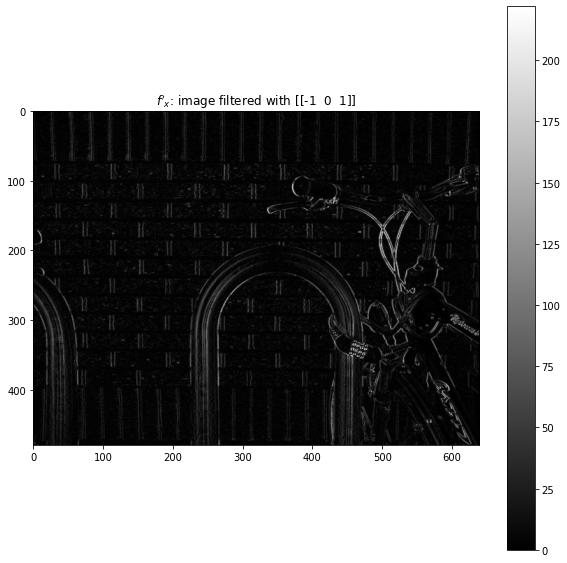

kernel shape is (1, 3)


In [21]:
img = img.astype(float)  # 'uint8' doesn't work with minus sign - for filtering

# 1. cv2.filter2D is working with corelation rether than convolution
#    no need to flip the kernel
# 2. Notice that kernel is 2D array - if 1d than we will get a column vector convolution
kernel = np.array([[-1, 0, +1]])
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(np.abs(dst), cmap='gray')
plt.colorbar()
plt.title('$f\'_x$: image filtered with '+str(kernel))
plt.show()

print("kernel shape is "+str(kernel.shape))



## Y Gradien Filter (No ABS)

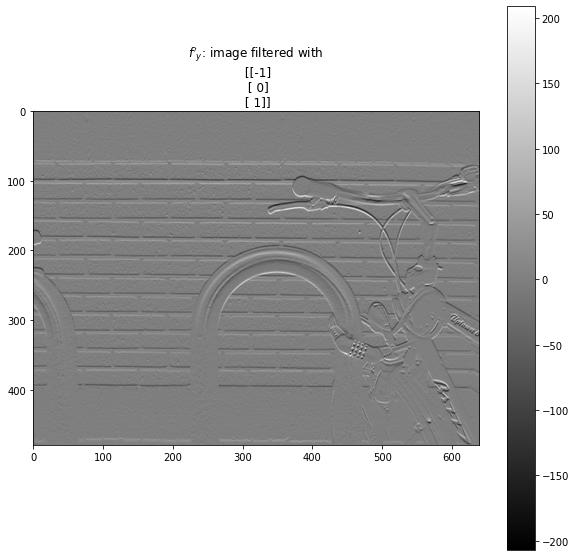

In [22]:
kernel = np.array([[-1, 0, +1]]).T
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(dst, cmap='gray')
plt.colorbar()
plt.title('$f\'_y$: image filtered with\n '+str(kernel))
plt.show()


##Perbandingan Dari X Gradient Filters

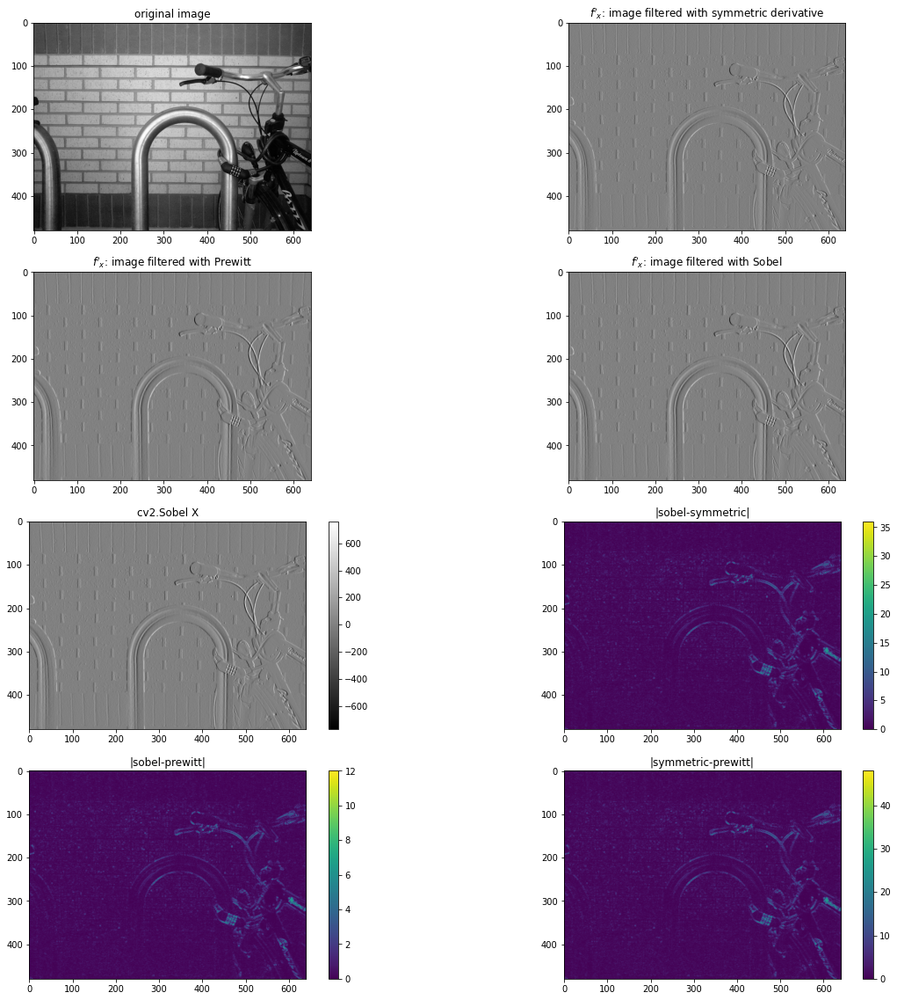

In [23]:
plt.rcParams['figure.figsize'] = [20, 20]

plt.subplot(4, 2, 1)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.title('original image')

#######################################
kernel = 1/2*np.array([[-1, 0, +1]])
dst_sym = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 2)
plt.imshow(dst_sym, cmap='gray')
plt.title('$f\'_x$: image filtered with symmetric derivative')

#######################################
kernel = 1/6*np.array([
    [-1, 0, +1],
    [-1, 0, +1],
    [-1, 0, +1]])
dst_prewitt = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 3)
plt.imshow(dst_prewitt, cmap='gray')
plt.title('$f\'_x$: image filtered with Prewitt')

#######################################
# cv2.Sobel() also exist
kernel = 1/8*np.array([
    [-1, 0, +1],
    [-2, 0, +2],
    [-1, 0, +1]])
dst_sobel = cv2.filter2D(img, -1, kernel)

plt.subplot(4, 2, 4)
plt.imshow(dst_sobel, cmap='gray')
plt.title('$f\'_x$: image filtered with Sobel')

#######################################
dst_cv2_sobel = cv2.Sobel(img, -1, 1, 0)  #cv2.Sobel(img,ddepth,x_size,y_size)

plt.subplot(4, 2, 5)
plt.imshow(dst_cv2_sobel, cmap='gray')
plt.colorbar()
plt.title('cv2.Sobel X')

#######################################
plt.subplot(4, 2, 6)
plt.imshow(np.abs(dst_sobel-dst_sym))
plt.colorbar()
plt.title('|sobel-symmetric|')

#######################################
plt.subplot(4, 2, 7)
plt.imshow(np.abs(dst_sobel-dst_prewitt))
plt.colorbar()
plt.title('|sobel-prewitt|')

#######################################
plt.subplot(4, 2, 8)
plt.imshow(np.abs(dst_sym-dst_prewitt)) 
plt.colorbar()
plt.title('|symmetric-prewitt|')

plt.show()


# Filtering Common Errors
## Kernel Dimension Error

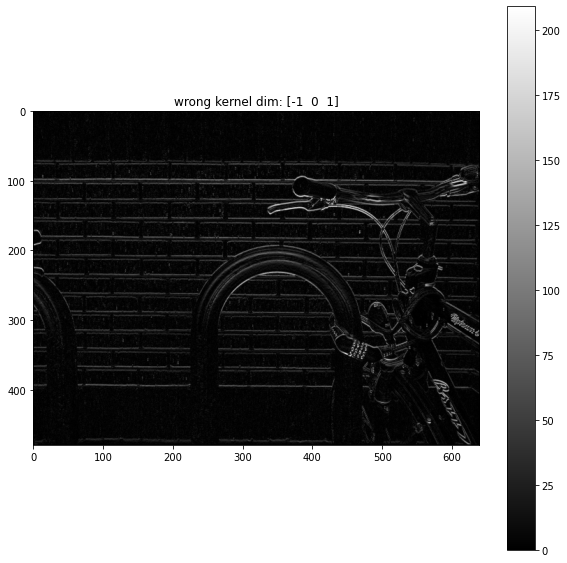

kernel shape is (3,)


In [24]:
kernel = np.array([-1, 0, +1])
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=figsize)
plt.imshow(np.abs(dst), cmap='gray')
plt.colorbar()
plt.title('wrong kernel dim: '+str(kernel))
plt.show()

print("kernel shape is "+str(kernel.shape))